## Notebook to to re-cluster on just a subset of selected cells

using Pegasus

In [1]:
!date

#### import libraries and set notebook variables

In [2]:
import pegasus as pg
import numpy as np
import pandas as pd
import warnings
warnings.simplefilter('ignore')

2021-12-07 15:34:20.298371: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


In [3]:
# naming
cohort = 'aging'
assay = 'RNA'

# directories for initial setup
home_dir = '/labshare/raph/datasets/adrd_neuro'
wrk_dir = f'{home_dir}/{cohort}'
quants_dir = f'{wrk_dir}/demux'

# in files
data_file = f'{quants_dir}/{cohort}.pegasus.leiden_085.Age_group_young_old.h5ad'
markers_json = f'{wrk_dir}/expression/human_brain_cell_markers_LNG.json'

# out files
output_file = f'{quants_dir}/{cohort}.pegasus.leiden_085.subclustered.h5ad'

# constants
# here start with relatively low resolution since already potentially sub-clustering
leiden_resolution = 0.2

#### read the anndata (h5ad) file

In [4]:
%%time
data = pg.read_input(data_file)
data

2021-12-07 15:36:11,303 - pegasusio.readwrite - INFO - h5ad file '/labshare/raph/datasets/adrd_neuro/aging/demux/aging.pegasus.leiden_085.Age_group_young_old.h5ad' is loaded.
2021-12-07 15:36:11,305 - pegasusio.readwrite - INFO - Function 'read_input' finished in 110.17s.
CPU times: user 55.7 s, sys: 2.73 s, total: 58.4 s
Wall time: 1min 50s


MultimodalData object with 1 UnimodalData: 'unknown-rna'
    It currently binds to UnimodalData object unknown-rna

UnimodalData object with n_obs x n_vars = 167945 x 35441
    Genome: unknown; Modality: rna
    It contains 2 matrices: 'X', 'raw.X'
    It currently binds to matrix 'X' as X

    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'X_umap_085'
    varm: 'de_res', 'gmeans', 'gstds', 'means', 'partial_sum'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 

#### take a look at the cell counts by cell type

In [5]:
# get cell counts by 'categories'
categories = ['Brain_region', 'new_anno', 'leiden_labels_085']
for this_cat in categories:
    print(data.obs[this_cat].value_counts())

Entorhinal cortex        54399
Putamen                  49625
Subventricular zone      36610
Middle temporal gyrus    27311
Name: Brain_region, dtype: int64
Oligodendrocyte-1    36479
SPN D1               15379
SPN D2               15280
Oligodendrocyte-2    12844
Astrocyte            12208
ExN CUX2 LAMP5        9055
uncertain             7548
InN ADARB2 VIP        7014
ExN FEZF2             6842
OPC                   6682
ExN RORB THEMIS       5130
InN LHX6 PVALB        4566
Radial Glia           3669
Microglia             3265
InN ADARB2 LAMP5      3216
ExN CUX2 ADARB2       3066
InN LHX6 SST          2937
uncertain-2           2677
SPN D1-2              2388
Endothelial           2246
ExN RORB              1966
ExN LAMP5             1963
Astrocyte-GFAP-Hi      599
SPN D2-2               465
ExN THEMIS             461
Name: new_anno, dtype: int64
1     36479
2     15379
3     15280
4     12844
5     12208
6      9055
7      7548
8      7014
9      6842
10     6682
11     5130
12     

#### visualize existing Pegasus analyses UMAP

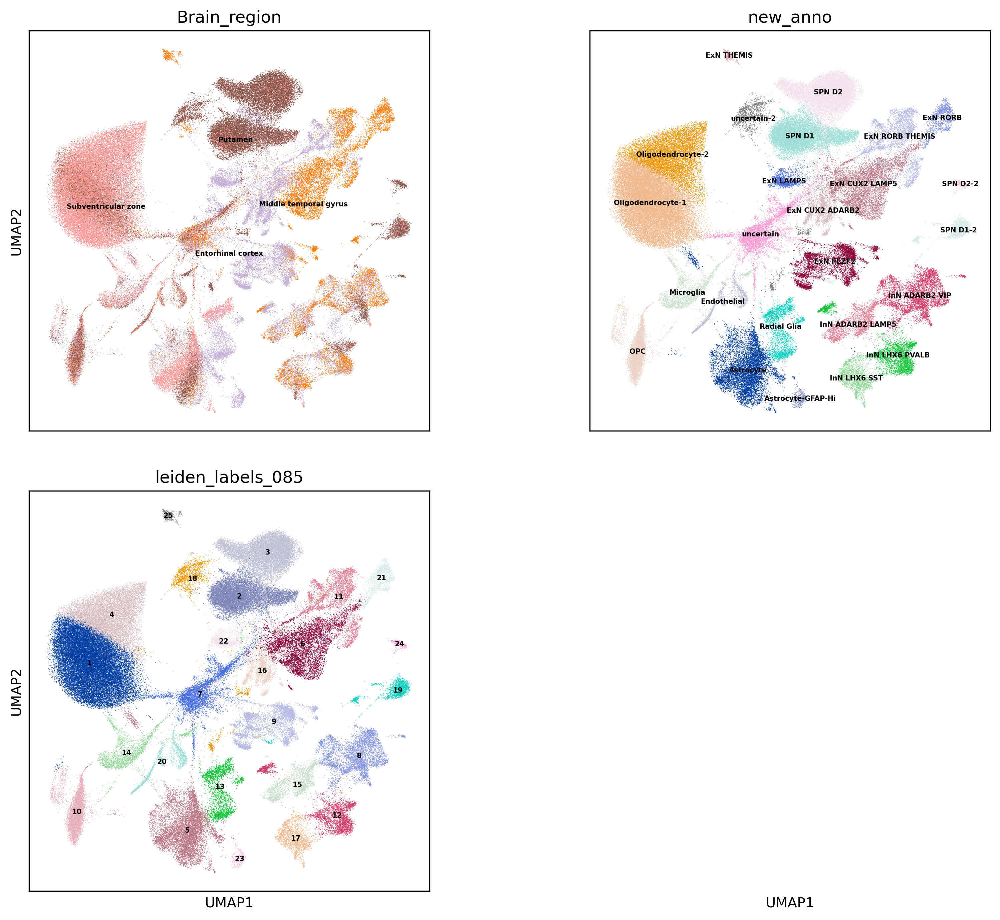

In [6]:
pg.scatter(data, attrs=categories, basis='umap', legend_loc='on data')

#### get sample counts per age group by  counts by 'categories'

In [7]:
for this_cat in categories:
    print(data.obs.groupby([this_cat,'Age_group'])['Sample_id'].nunique())

Brain_region           Age_group
Entorhinal cortex      old          6
                       young        6
Middle temporal gyrus  old          7
                       young        5
Putamen                old          7
                       young        5
Subventricular zone    old          6
                       young        6
Name: Sample_id, dtype: int64
new_anno           Age_group
Astrocyte          old          26
                   young        22
Astrocyte-GFAP-Hi  old           0
                   young         1
Endothelial        old          26
                   young        22
ExN CUX2 ADARB2    old           8
                   young         8
ExN CUX2 LAMP5     old          24
                   young        20
ExN FEZF2          old          15
                   young        13
ExN LAMP5          old           7
                   young         6
ExN RORB           old           8
                   young         8
ExN RORB THEMIS    old          14
         

#### subset cells of interest, to be re-clustered

In [8]:
# 1st Example: single grouping
# type_name = 'new_anno'
# group_name = 'Radial Glia'
# sub_data = data[data.obs[type_name] == group_name].copy()

# 2nd Example:  but probably grabbing multiple groups depending on leiden resolution
# you are working with from input, here was 0.85
type_name = 'new_anno'
group_names = ['Astrocyte', 'Radial Glia'] # ['Oligodendrocyte-1', 'Oligodendrocyte-2'] or ['uncertain', 'uncertain-2']
sub_data = data[data.obs[type_name].isin(group_names)].copy()

# 3rd Example: or similarly if doing by the pre-existing leiden labels
# type_name = 'leiden_labels_085'
# group_names = [3, 5, 15]
# sub_data = data[data.obs[type_name].isin(group_names)].copy()

#### visualize existing clusters for subset cells

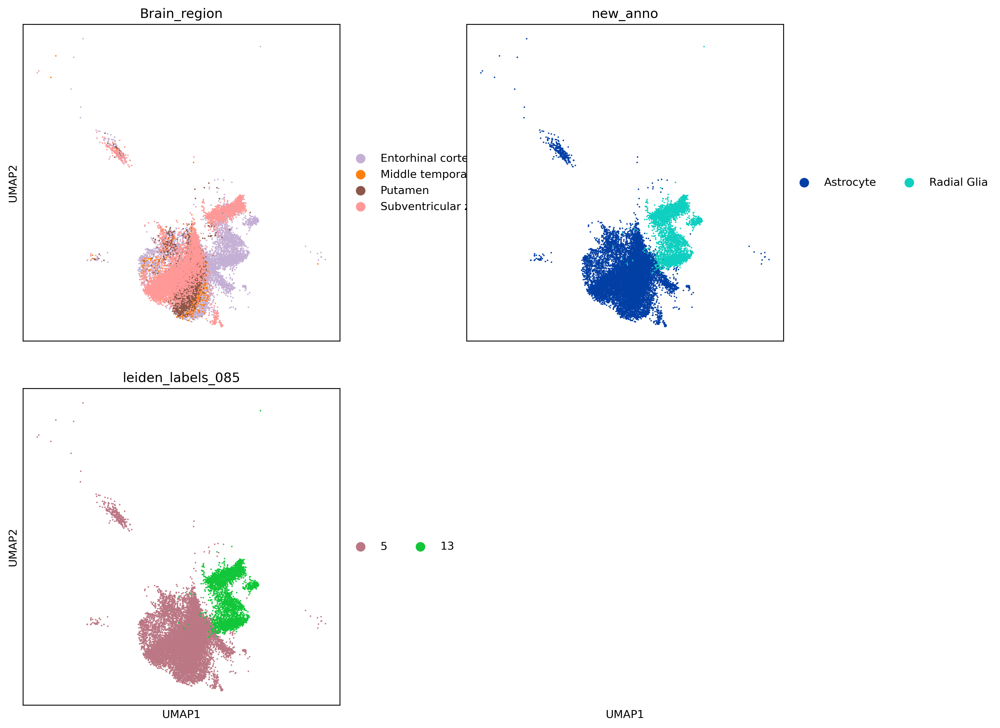

In [9]:
pg.scatter(sub_data, attrs=categories, basis='umap')

#### re-cluster the subset data (cells)

since we've subset from the Pegasus analysis, that did batch correction with Harmony, we are still using the same Harmony correction info, from Pegasus notebook markdown
from that notebook:
- `pca_key` is the representation key returned by `run_harmony` function, which is equivalent to string `"pca_harmony"`. In the following sections, you can use either `pca_key` or `"pca_harmony"` to specify `rep` parameter in Pegasus functions whenever applicable.

In [10]:
pg.neighbors(sub_data, rep="pca_harmony")

2021-12-07 15:36:16,954 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 2.03s.
2021-12-07 15:36:17,452 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.50s.


In [11]:
# here you can alter resolution as desired
this_res = leiden_resolution
# this_res = 0.3
this_label = f'sub_leid_{this_res}'
this_label = this_label.replace('.', '_')
pg.leiden(sub_data, rep="pca_harmony", resolution=this_res, 
          class_label=this_label)

2021-12-07 15:36:18,076 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.62s.
2021-12-07 15:36:19,391 - pegasus.tools.clustering - INFO - Leiden clustering is done. Get 3 clusters.
2021-12-07 15:36:19,469 - pegasus.tools.clustering - INFO - Function 'leiden' finished in 2.01s.


#### visualize sub-clustering

In [12]:
pg.umap(sub_data, rep="pca_harmony")

2021-12-07 15:36:19,474 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2021-12-07 15:36:19,475 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
2021-12-07 15:36:19,483 - pegasus.tools.visualization - INFO - UMAP(dens_frac=0.0, dens_lambda=0.0, min_dist=0.5, random_state=0, verbose=True)
2021-12-07 15:36:19,484 - pegasus.tools.visualization - INFO - Construct fuzzy simplicial set
2021-12-07 15:36:21,390 - pegasus.tools.visualization - INFO - Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
2021-12-07 15:36:34,071 - pegasus.tools.visualization - INFO - Function 'umap' finished in 14.60s.


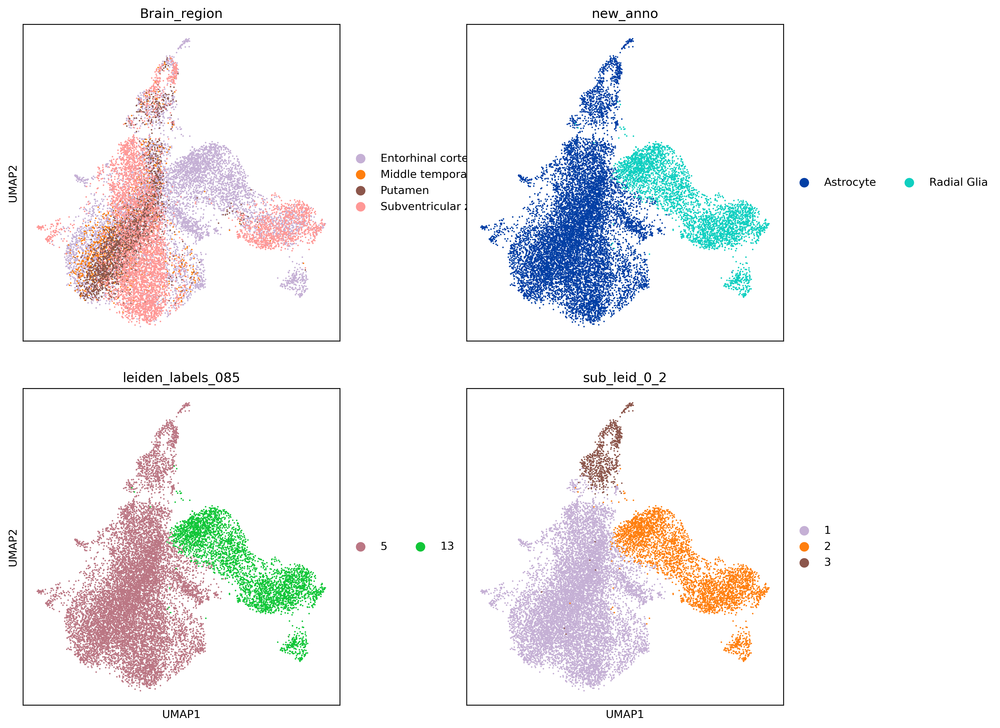

In [13]:
pg.scatter(sub_data, attrs=categories + [this_label], basis='umap')

## Differential Expression Analysis

With the clusters ready, we can now perform Differential Expression (DE) Analysis. DE analysis is to discover cluster-specific marker genes. For each cluster, it compares cells within the cluster with all the others, then finds genes significantly highly expressed (up-regulated) and lowly expressed (down-regulated) for the cluster.

Now use `de_analysis` method to run DE analysis. We use Louvain result here. 

In [14]:
pg.de_analysis(sub_data, cluster=this_label)

2021-12-07 15:36:35,502 - pegasus.tools.diff_expr - INFO - CSR matrix is converted to CSC matrix. Time spent = 0.3605s.


2021-12-07 15:36:40.557083: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 15:36:40.588297: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 15:36:40.648630: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 15:36:40.649186: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 15:36:40.663684: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 15:36:40.675189: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 15:36:40.684716: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic libr

2021-12-07 15:36:43,333 - pegasus.tools.diff_expr - INFO - MWU test and AUROC calculation are finished. Time spent = 7.8308s.
2021-12-07 15:36:43,488 - pegasus.tools.diff_expr - INFO - Sufficient statistics are collected. Time spent = 0.1557s.
2021-12-07 15:36:43,521 - pegasus.tools.diff_expr - INFO - Differential expression analysis is finished.
2021-12-07 15:36:43,522 - pegasus.tools.diff_expr - INFO - Function 'de_analysis' finished in 8.38s.


By default, DE analysis runs Mann-Whitney U (MWU) test.

Alternatively, you can also run the follow tests by setting their corresponding parameters to be `True`:
* `fisher`: Fisher’s exact test.
* `t`: Welch’s T test.

DE analysis result is stored with key `"de_res"` (by default) in `varm` field of data. See [documentation](https://pegasus.readthedocs.io/en/stable/api/pegasus.de_analysis.html) for more details. 

To load the result in a human-readable format, use `markers` method:

In [15]:
marker_dict = pg.markers(sub_data)

By default, `markers`:
* Sort genes by Area under ROC curve (AUROC) in descending order;
* Use $\alpha = 0.05$ significance level on q-values for inference.

See [documentation](https://pegasus.readthedocs.io/en/stable/api/pegasus.markers.html) for customizing these parameters.

Let's see the up-regulated genes for Cluster 1, and rank them in descending order with respect to log fold change:

In [16]:
marker_dict['2']['up'].sort_values(by='log2FC', ascending=False)

,log2Mean,log2Mean_other,log2FC,percentage,percentage_other,percentage_fold_change,auroc,mwu_U,mwu_pval,mwu_qval
feature,,,,,,,,,,
CFAP299,5.142363,0.600920,4.541442,65.651939,11.171393,5.876791e+00,0.799402,36098187.0,0.000000e+00,0.000000e+00
SDK1,6.065169,1.555194,4.509975,91.298492,29.132757,3.133878e+00,0.892434,40299190.5,0.000000e+00,0.000000e+00
RMST,7.063722,2.670038,4.393683,96.390083,48.121662,2.003050e+00,0.897402,40523500.0,0.000000e+00,0.000000e+00
SLIT2,4.825184,0.698043,4.127142,80.441811,13.177148,6.104645e+00,0.853771,38553311.5,0.000000e+00,0.000000e+00
SPAG17,4.552358,0.521352,4.031006,69.719826,10.464447,6.662543e+00,0.821305,37087221.0,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
GPR33,0.001032,0.000000,0.001032,0.053879,0.000000,1.000000e+30,0.500269,22590405.0,1.046315e-02,2.282277e-02
AC236972.4,0.000976,0.000000,0.000976,0.053879,0.000000,1.000000e+30,0.500269,22590405.0,1.046315e-02,2.282277e-02
AC017006.1,0.000970,0.000000,0.000970,0.053879,0.000000,1.000000e+30,0.500269,22590405.0,1.046315e-02,2.282277e-02


We can also use Volcano plot to see the DE result. Below is such a plot w.r.t. each Cluster with MWU test results (by default):

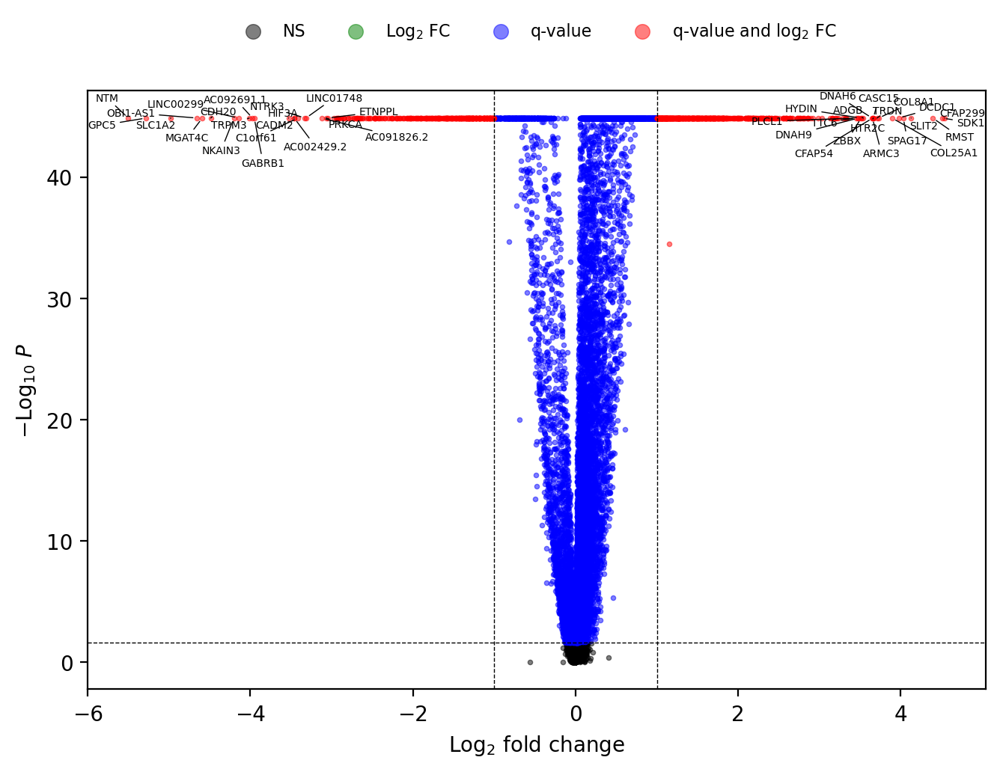

In [17]:
pg.volcano(sub_data, cluster_id=2, dpi=200)

The plot above uses the default thresholds: log fold change at $1$ (i.e. fold change at $2$), and q-value at $0.05$. Each point stands for a gene. Red ones are significant marker genes: those at right-hand side are up-regulated genes for Cluster 1, while those at left-hand side are down-regulated genes.

## Cell Type Annotation

After done with DE analysis, we can use the test result to annotate the clusters.

In [18]:
markers_json

'/labshare/raph/datasets/adrd_neuro/aging/expression/human_brain_cell_markers_LNG.json'

#### here I've lowered threshold from default 0.5 to 0.05, to see without threshold what label would be

In [19]:
celltype_dict = pg.infer_cell_types(sub_data, markers=markers_json, threshold=0.05)
cluster_names = pg.infer_cluster_names(celltype_dict)

`infer_cell_types` has 2 critical parameters to set:
* `markers`: Either `'human_immune'`, `'mouse_immune'`, `'human_brain'`, `'mouse_brain'`, `'human_lung'`, or a user-specified marker dictionary.
* `de_test`: Decide which DE analysis test to be used for cell type inference. It can be either `'t'`, `'fisher'`, or `'mwu'`. Its default is `'mwu'`.

`infer_cluster_names` by default uses `threshold = 0.5` to filter out candidate cell types of scores lower than 0.5.

See [documentation](https://pegasus.readthedocs.io/en/stable/api/pegasus.infer_cell_types.html) for details.

Below is the cell type annotation report for each Cluster:

In [20]:
sub_data.obs[this_label].value_counts()

1    11365
2     3712
3      800
Name: sub_leid_0_2, dtype: int64

In [21]:
for leid_label in sub_data.obs[this_label].unique():
    print(leid_label)
    print(celltype_dict[leid_label])

1
[name: Astrocyte; score: 0.92; average marker percentage: 59.43%; strong support: (GFAP+,58.87%),(APOE+,37.99%),(SLC1A2+,85.62%),(SLC14A1+,64.86%),(CPE+,83.31%),(CLU+,71.03%),(AQP4+,78.29%); weak support: (SLC1A3+,95.26%),(ALDOC+,11.54%),(GJB6+,7.52%), name: OPC_ODC; score: 0.40; average marker percentage: 49.68%; strong support: (VCAN+,45.34%),(CNTN1+,84.32%); weak support: (TNR+,19.38%), name: Mural; score: 0.25; average marker percentage: 48.49%; strong support: (PDGFRB+,27.99%),(PTN+,38.71%),(ATP1A2+,78.79%), name: Neuron; score: 0.17; average marker percentage: 31.30%; strong support: (CAMK2B+,31.30%), name: Endothelial; score: 0.14; average marker percentage: 20.21%; weak support: (COLEC12+,31.67%),(APOLD1+,8.75%), name: Oligodendrocyte; score: 0.12; average marker percentage: 26.07%; strong support: (CRYAB+,26.07%), name: Microglia; score: 0.07; average marker percentage: 5.13%; weak support: (CSF1R+,1.16%),(P2RY12+,9.10%)]
3
[name: Oligodendrocyte; score: 0.96; average marker

The report has a list of predicted cell types along with their scores and support genes for users to decide.

Next, substitute the inferred cluster names in data using `annotate` function:

In [22]:
pg.annotate(sub_data, name='sub_anno', based_on=this_label, anno_dict=cluster_names)
sub_data.obs['sub_anno'].value_counts()

Astrocyte          11365
2                   3712
Oligodendrocyte      800
Name: sub_anno, dtype: int64

So the cluster-specific cell type information is stored in `data.obs['anno']`.

The `anno_dict` can be either a list or a dictionary. If provided a list (which is the case here), Pegasus will match cell types with cluster labels in the same order. Alternatively, you can create an annotation dictionary with keys being cluster labels and cell types being values.

In practice, users may want to manually create this annotation structure by reading the report in `celltype_dict`. In this tutorial, we'll just use the output of `infer_cluster_names` function for demonstration.

Now plot the data with cell types:

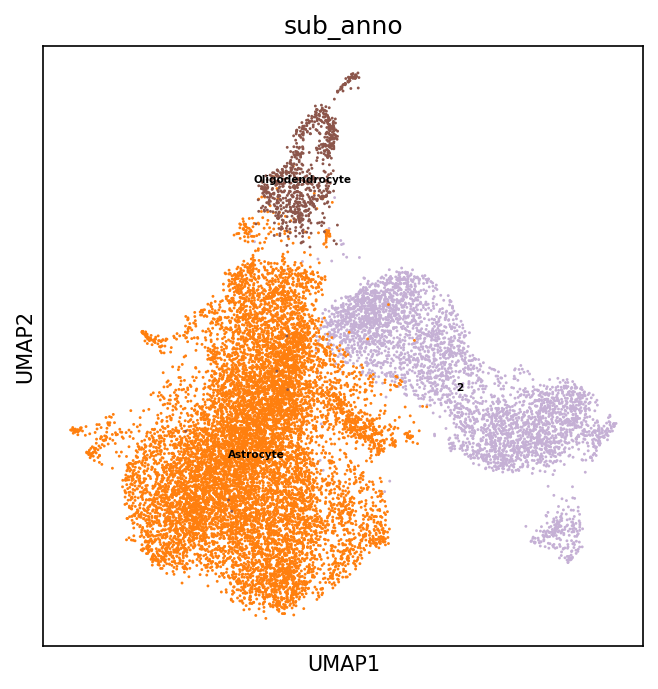

In [23]:
pg.scatter(sub_data, attrs='sub_anno', basis='umap', legend_loc='on data', dpi=150)

#### so cluster 2, wasn't IDed for cell-type
where cluster 2 contains the Entorhinal cortex 'radial glia(?)'

can we use GSEA to auto-ID cell-types

In [24]:
import gseapy

In [25]:
# gbm_marker_dict = pg.find_markers(sub_data, label_attr=this_label)
# pg.find_markers(sub_data, label_attr=this_label, random_state=42, remove_ribo=True)

In [26]:
this_leid_cluster = '2'
top_gene_cnt = 25

up_markers = marker_dict[this_leid_cluster]['up']
up_2fc_sig = up_markers.loc[(up_markers['log2FC'] > 2) & up_markers['mwu_qval'] < 0.05]
print(up_2fc_sig.shape)

display(up_2fc_sig.sort_values(by='log2FC', ascending=False).head())

(13589, 10)


,log2Mean,log2Mean_other,log2FC,percentage,percentage_other,percentage_fold_change,auroc,mwu_U,mwu_pval,mwu_qval
feature,,,,,,,,,,
CFAP299,5.142363,0.600920,4.541442,65.651939,11.171393,5.876791,0.799402,36098187.0,0.0,0.0
SDK1,6.065169,1.555194,4.509975,91.298492,29.132757,3.133878,0.892434,40299190.5,0.0,0.0
RMST,7.063722,2.670038,4.393683,96.390083,48.121662,2.003050,0.897402,40523500.0,0.0,0.0
SLIT2,4.825184,0.698043,4.127142,80.441811,13.177148,6.104645,0.853771,38553311.5,0.0,0.0
SPAG17,4.552358,0.521352,4.031006,69.719826,10.464447,6.662543,0.821305,37087221.0,0.0,0.0


In [27]:
gene_list = list(up_2fc_sig.sort_values(by='log2FC', ascending=False).head(top_gene_cnt).index.values)

In [28]:
gene_set_names = gseapy.get_library_name(database='Human')

(115, 10)


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,CellMarker_Augmented_2021,Ciliated Epithelial cell:Esophagus,11/425,1.196523e-12,1.376002e-10,0,0,37.124051,1019.114634,ADGB;SPAG17;ARMC3;LRRIQ1;DNAH6;ZBBX;HYDIN;DNAH...
1,CellMarker_Augmented_2021,Primordial Germ cell:Germ,3/92,2.013145e-04,9.871390e-03,0,0,30.468846,259.309442,ZBBX;HYDIN;DNAH9
2,CellMarker_Augmented_2021,Pigment Epithelial cell:Eye,3/100,2.575145e-04,9.871390e-03,0,0,27.944705,230.947181,ZBBX;STK32A;CFAP43
3,CellMarker_Augmented_2021,PROM1High Progenitor cell:Large Intestine,2/96,6.365686e-03,4.486847e-02,0,0,18.391304,93.001760,COL8A1;SLIT2
4,CellMarker_Augmented_2021,DCLK1+ Progenitor cell:Large Intestine,2/98,6.624998e-03,4.486847e-02,0,0,18.006341,90.336103,LAMA2;COL8A1


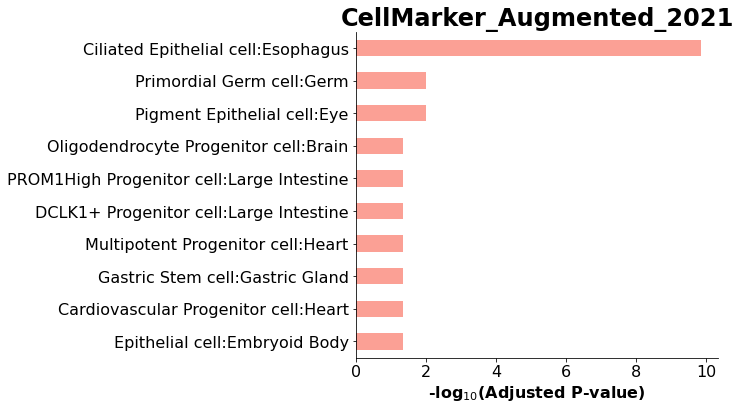

In [29]:
gene_set = 'CellMarker_Augmented_2021'
enr_res = gseapy.enrichr(gene_list=gene_list,
                         organism='Human',
                         gene_sets=gene_set,
                         description='pathway',
                         cutoff = 0.5)
print(enr_res.results.shape)
display(enr_res.results.head())
gseapy.barplot(enr_res.res2d,title=gene_set)

In [30]:
gene_set = 'Allen_Brain_Atlas_10x_scRNA_2021'
enr_res = gseapy.enrichr(gene_list=gene_list,
                         organism='Human',
                         gene_sets=gene_set,
                         description='pathway',
                         cutoff = 0.5)
print(enr_res.results.shape)
display(enr_res.results.head())
gseapy.barplot(enr_res.res2d,title=gene_set)

(67, 10)


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,Allen_Brain_Atlas_10x_scRNA_2021,Mouse 371 Peri up,2/44,0.001374,0.050849,0,0,41.269151,271.961682,LAMA2;PLCL1
1,Allen_Brain_Atlas_10x_scRNA_2021,Human Exc L2-3 LINC00507 DSG3 up,3/184,0.001518,0.050849,0,0,14.912607,96.789279,HYDIN;DNAH9;CFAP54
2,Allen_Brain_Atlas_10x_scRNA_2021,Mouse 297 CA3 up,2/105,0.007570,0.133437,0,0,16.776699,81.930170,HTR2C;DNAH9
3,Allen_Brain_Atlas_10x_scRNA_2021,Human Exc L5 THEMIS FGF10 down,1/7,0.008718,0.133437,0,0,138.673611,657.633561,KIAA1217
4,Allen_Brain_Atlas_10x_scRNA_2021,Human Exc L3-5 RORB LNX2 down,1/8,0.009958,0.133437,0,0,118.857143,547.857721,KIAA1217


'Warning: No enrich terms using library Allen_Brain_Atlas_10x_scRNA_2021 when cutoff = 0.05'

#### for still un-indentified sub-clusters manually set a cell-type label

here cluster-2, the radial glia stuff we were trying to get a better feel for didn't improve to much, so until further interogation is done manually labeling as <b>uncertain-3</b>

In [31]:
# printing the counts before/after to see change
print(sub_data.obs['sub_anno'].value_counts())
sub_data.obs['sub_anno'] = np.where(sub_data.obs['sub_anno'] == '2', 
                                    'uncertain-3', sub_data.obs['sub_anno'])
print(sub_data.obs['sub_anno'].value_counts())

Astrocyte          11365
2                   3712
Oligodendrocyte      800
Name: sub_anno, dtype: int64
Astrocyte          11365
uncertain-3         3712
Oligodendrocyte      800
Name: sub_anno, dtype: int64


#### now transfer, ie replace, the sub_data sub_anno values to the data new_anno values

In [32]:
# capture the before counts
before_chng_cnts = data.obs['new_anno'].value_counts()
# now iterate sub-cluster cell-types and update full data
for cell_label in sub_data.obs['sub_anno'].unique():
    print(cell_label)
    # pandas stuff is a new cell label have to add the category(?)
    if not cell_label in data.obs['new_anno'].unique():
        data.obs['new_anno'] = data.obs['new_anno'].cat.add_categories(cell_label)
    cell_ids_to_update = sub_data.obs.loc[sub_data.obs['sub_anno'] == cell_label].index.tolist()
    data.obs.loc[data.obs.index.isin(cell_ids_to_update), 'new_anno'] = cell_label

Astrocyte
Oligodendrocyte
uncertain-3


In [33]:
# compare counts before and after update    
after_chng_cnts = data.obs['new_anno'].value_counts()
display(pd.concat([before_chng_cnts, after_chng_cnts], axis='columns'))

,new_anno,new_anno
Astrocyte,12208.0,11365
Astrocyte-GFAP-Hi,599.0,599
Endothelial,2246.0,2246
ExN CUX2 ADARB2,3066.0,3066
ExN CUX2 LAMP5,9055.0,9055
ExN FEZF2,6842.0,6842
ExN LAMP5,1963.0,1963
ExN RORB,1966.0,1966
ExN RORB THEMIS,5130.0,5130
ExN THEMIS,461.0,461


#### visualize umap for full data cell-types again

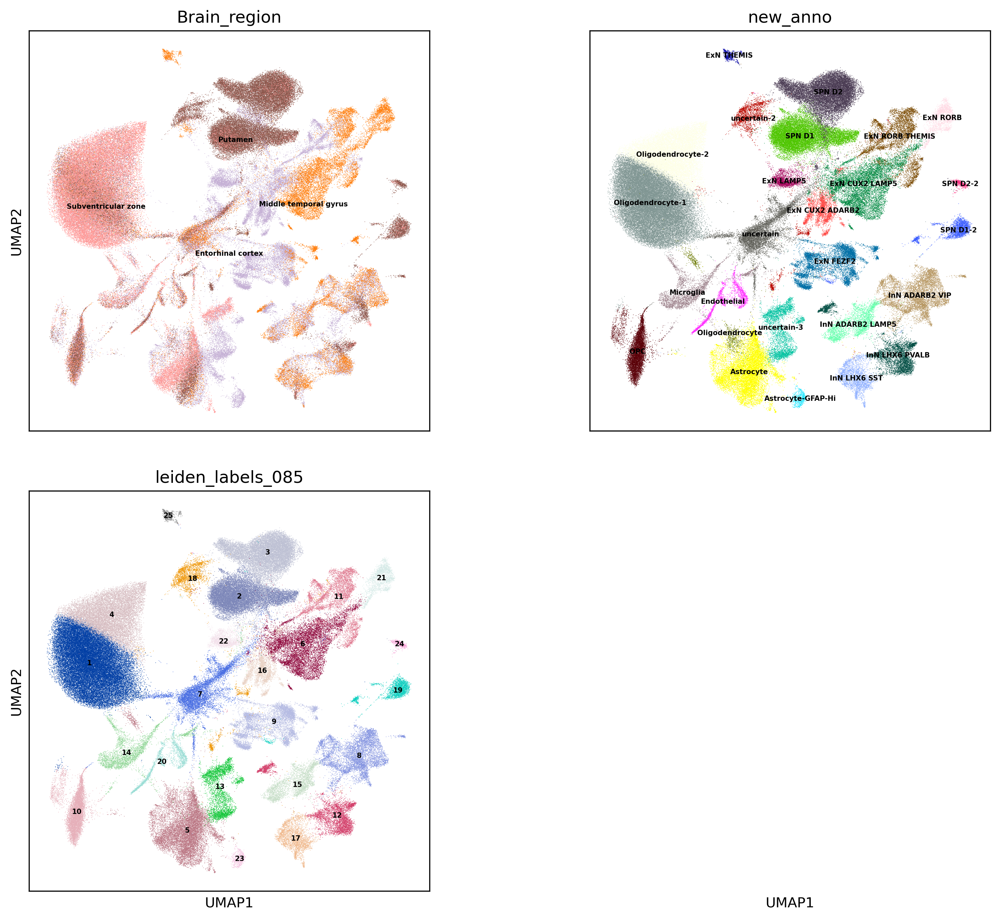

In [34]:
pg.scatter(data, attrs=categories, basis='umap', legend_loc='on data')

#### save to full updated anndata object

In [35]:
%%time
pg.write_output(data, output_file, file_type='h5ad')

2021-12-07 15:41:18,355 - pegasusio.readwrite - INFO - h5ad file '/labshare/raph/datasets/adrd_neuro/aging/demux/aging.pegasus.leiden_085.subclustered.h5ad' is written.
2021-12-07 15:41:18,357 - pegasusio.readwrite - INFO - Function 'write_output' finished in 262.87s.
CPU times: user 3min 46s, sys: 1.32 s, total: 3min 48s
Wall time: 4min 22s
